In [22]:
pip install keplergl

In [23]:
# Installing libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import output
output.enable_custom_widget_manager()

import warnings
warnings.filterwarnings("ignore") 

Reading file contents

In [24]:
df = pd.read_csv('/content/tectonic_plates.csv')

In [25]:
df.isna().sum()

plate    0
lat      0
lon      0
dtype: int64

Creating map - Tectonic Plates

In [26]:
from keplergl import KeplerGl
map_1 = KeplerGl(height = 600)
map_1.add_data(data=df, name = 'Plates Visualization')

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


In [27]:
map_1

KeplerGl(data={'Plates Visualization': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17…

Reading earthquake data

In [28]:
df2 = pd.read_csv('/content/database.csv')

In [29]:
map_1.add_data(data = df2, name = 'Earthquakes')

In [30]:
# This shows the different data files added to the map. Here we have added two 
map_1.data

{'Earthquakes': {'columns': ['Date',
   'Time',
   'Latitude',
   'Longitude',
   'Type',
   'Depth',
   'Depth Error',
   'Depth Seismic Stations',
   'Magnitude',
   'Magnitude Type',
   'Magnitude Error',
   'Magnitude Seismic Stations',
   'Azimuthal Gap',
   'Horizontal Distance',
   'Horizontal Error',
   'Root Mean Square',
   'ID',
   'Source',
   'Location Source',
   'Magnitude Source',
   'Status'],
  'data': [['01/02/1965',
    '13:44:18',
    19.246,
    145.616,
    'Earthquake',
    131.6,
    nan,
    nan,
    6.0,
    'MW',
    nan,
    nan,
    nan,
    nan,
    nan,
    nan,
    'ISCGEM860706',
    'ISCGEM',
    'ISCGEM',
    'ISCGEM',
    'Automatic'],
   ['01/04/1965',
    '11:29:49',
    1.863,
    127.352,
    'Earthquake',
    80.0,
    nan,
    nan,
    5.8,
    'MW',
    nan,
    nan,
    nan,
    nan,
    nan,
    nan,
    'ISCGEM860737',
    'ISCGEM',
    'ISCGEM',
    'ISCGEM',
    'Automatic'],
   ['01/05/1965',
    '18:05:58',
    -20.579,
    -173.972,
 

Creating Layered Map - Earthquakes and Plates

In [31]:
map_1

KeplerGl(data={'Plates Visualization': {'index': [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17…

In [32]:
map_1.save_to_html(file_name= 'Plates.html')

Map saved to Plates.html!


Reading Data - This file was created in Part-1 

In [33]:
df3 = pd.read_csv('/content/Locations (2).csv')
# df3.drop(columns = ['Name_y'], inplace = True)
# df3.rename(columns = {'Name_x': 'Name'}, inplace = True)
df3.head()

,Date,Time,Latitude,Longitude,Depth,Magnitude,ID,Country,Name_x,Name_y
0,01/02/1965,13:44:18,19.246,145.616,131.6,6.0,ISCGEM860706,MP,Northern Mariana Islands,Northern Mariana Islands
1,02/17/1965,18:23:57,21.527,143.081,340.0,5.6,ISCGEM860296,MP,Northern Mariana Islands,Northern Mariana Islands
2,04/25/1965,01:00:15,24.409,142.776,30.0,6.0,ISCGEM858003,MP,Northern Mariana Islands,Northern Mariana Islands
3,02/10/1966,14:21:13,20.711,146.163,45.7,6.5,ISCGEM850077,MP,Northern Mariana Islands,Northern Mariana Islands
4,03/29/1966,02:17:40,23.869,142.248,80.0,6.0,ISCGEM849682,MP,Northern Mariana Islands,Northern Mariana Islands


Plotting Indian Earthquakes

In [34]:
filt = (df3['Country'] == 'IN')
Indian_EQ= df3[filt]

In [35]:
map_2 = KeplerGl(height = 1300)
map_2.add_data(data=Indian_EQ, name = 'Earthquakes Visualization')
map_2

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'Earthquakes Visualization': {'index': [7726, 7727, 7728, 7729, 7730, 7731, 7732, 7733, 7734, 7…

India, Japan and the World comparison for earthquake magnitude

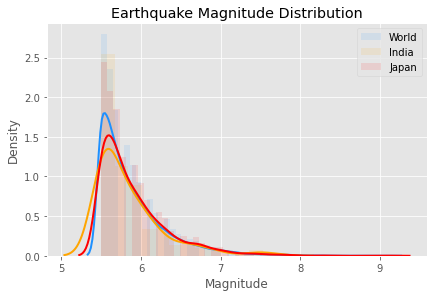

In [36]:
plt.style.use('ggplot')  
plt.title('Earthquake Magnitude Distribution')
plt.tight_layout()

# Preparing data
df4 = df3.loc[df3.Country.isin(['IN', 'JP'])]
filt1 = (df4['Country'] == 'IN')
filt2 = (df4['Country'] == 'JP')

India = df4[filt1]
Japan = df4[filt2]

# Plot
kwargs = dict(hist_kws={'alpha':.1}, kde_kws={'linewidth':2})

sns.distplot(df3['Magnitude'], color="dodgerblue", label="World", **kwargs)
sns.distplot(India['Magnitude'], color="orange", label="India", **kwargs)
sns.distplot(Japan['Magnitude'], color="red", label="Japan", **kwargs)
plt.legend();
plt.savefig('2a.png')